In [100]:
#imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error , mean_absolute_error, mean_absolute_percentage_error
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from autoviz import AutoViz_Class as AV
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
warnings.filterwarnings('ignore')

#read dataset
df = pd.read_csv('CarPrice_Assignment.csv')

df.head()





,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,89,...,130,mpfi,3,3,9,111,5000,21,27,13495
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,89,...,130,mpfi,3,3,9,111,5000,21,27,16500
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94,...,152,mpfi,3,3,9,154,5000,19,26,16500
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,100,...,109,mpfi,3,3,10,102,5500,24,30,13950
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99,...,136,mpfi,3,3,8,115,5500,18,22,17450


In [2]:
#drop car_ID column because it has a little use
df.drop(columns='car_ID',inplace=True)

#understand the shape
print(f"Shape of the dataset{df.shape}") #(205 sample, 26 features)



Shape of the dataset(205, 25)


Checking Basic Statistics

In [3]:
df.describe().round(2)

,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
count,205.00,205.00,205.00,205.00,205.00,205.00,205.00,205.00,205.00,205.00,205.00,205.00,205.00,205.00,205.00
mean,0.83,98.76,174.05,65.91,53.72,2555.57,126.91,3.33,3.26,10.14,104.12,5125.12,25.22,30.75,13276.71
std,1.25,6.02,12.34,2.15,2.44,520.68,41.64,0.27,0.31,3.97,39.54,476.99,6.54,6.89,7988.85
min,-2.00,86.60,141.10,60.30,47.80,1488.00,61.00,2.54,2.07,7.00,48.00,4150.00,13.00,16.00,5118.00
25%,0.00,94.50,166.30,64.10,52.00,2145.00,97.00,3.15,3.11,8.60,70.00,4800.00,19.00,25.00,7788.00
50%,1.00,97.00,173.20,65.50,54.10,2414.00,120.00,3.31,3.29,9.00,95.00,5200.00,24.00,30.00,10295.00
75%,2.00,102.40,183.10,66.90,55.50,2935.00,141.00,3.58,3.41,9.40,116.00,5500.00,30.00,34.00,16503.00
max,3.00,120.90,208.10,72.30,59.80,4066.00,326.00,3.94,4.17,23.00,288.00,6600.00,49.00,54.00,45400.00


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   symboling         205 non-null    int64  
 1   CarName           205 non-null    object 
 2   fueltype          205 non-null    object 
 3   aspiration        205 non-null    object 
 4   doornumber        205 non-null    object 
 5   carbody           205 non-null    object 
 6   drivewheel        205 non-null    object 
 7   enginelocation    205 non-null    object 
 8   wheelbase         205 non-null    float64
 9   carlength         205 non-null    float64
 10  carwidth          205 non-null    float64
 11  carheight         205 non-null    float64
 12  curbweight        205 non-null    int64  
 13  enginetype        205 non-null    object 
 14  cylindernumber    205 non-null    object 
 15  enginesize        205 non-null    int64  
 16  fuelsystem        205 non-null    object 
 1

In [6]:
list(df.CarName.value_counts().index) # get names of different cars

['toyota corona',
 'toyota corolla',
 'peugeot 504',
 'subaru dl',
 'mitsubishi mirage g4',
 'mazda 626',
 'toyota mark ii',
 'mitsubishi outlander',
 'mitsubishi g4',
 'honda civic',
 'volvo 264gl',
 'bmw 320i',
 'isuzu D-Max ',
 'audi 100ls',
 'volvo 244dl',
 'porsche cayenne',
 'toyota corolla liftback',
 'honda accord',
 'bmw x3',
 'volvo 144ea',
 'volvo 145e (sw)',
 'honda civic cvcc',
 'saab 99le',
 'toyota starlet',
 'saab 99gle',
 'toyota corolla 1200',
 'mazda rx-4',
 'mazda glc deluxe',
 'nissan rogue',
 'nissan latio',
 'mazda glc',
 'mazda rx-7 gs',
 'plymouth fury iii',
 'volkswagen dasher',
 'subaru',
 'nissan clipper',
 'peugeot 604sl',
 'saab 99e',
 'peugeot 304',
 'peugeot 504 (sw)',
 'renault 5 gtl',
 'renault 12tl',
 'porsche boxter',
 'subaru brz',
 'porsche macan',
 'plymouth duster',
 'plymouth valiant',
 'plymouth fury gran sedan',
 'plymouth satellite custom (sw)',
 'plymouth cricket',
 'peugeot 505s turbo diesel',
 'porcshce panamera',
 'toyota corona mark ii',

In [7]:
df.isnull().sum() # no null values

symboling           0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
dtype: int64

Lets visualize the data

Shape of your Data Set loaded: (205, 26)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  7
    Number of Integer-Categorical Columns =  7
    Number of String-Categorical Columns =  5
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  4
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    25 Predictors classified...
        1 variables removed since they were ID or low-information variables

################ Regression problem #####################


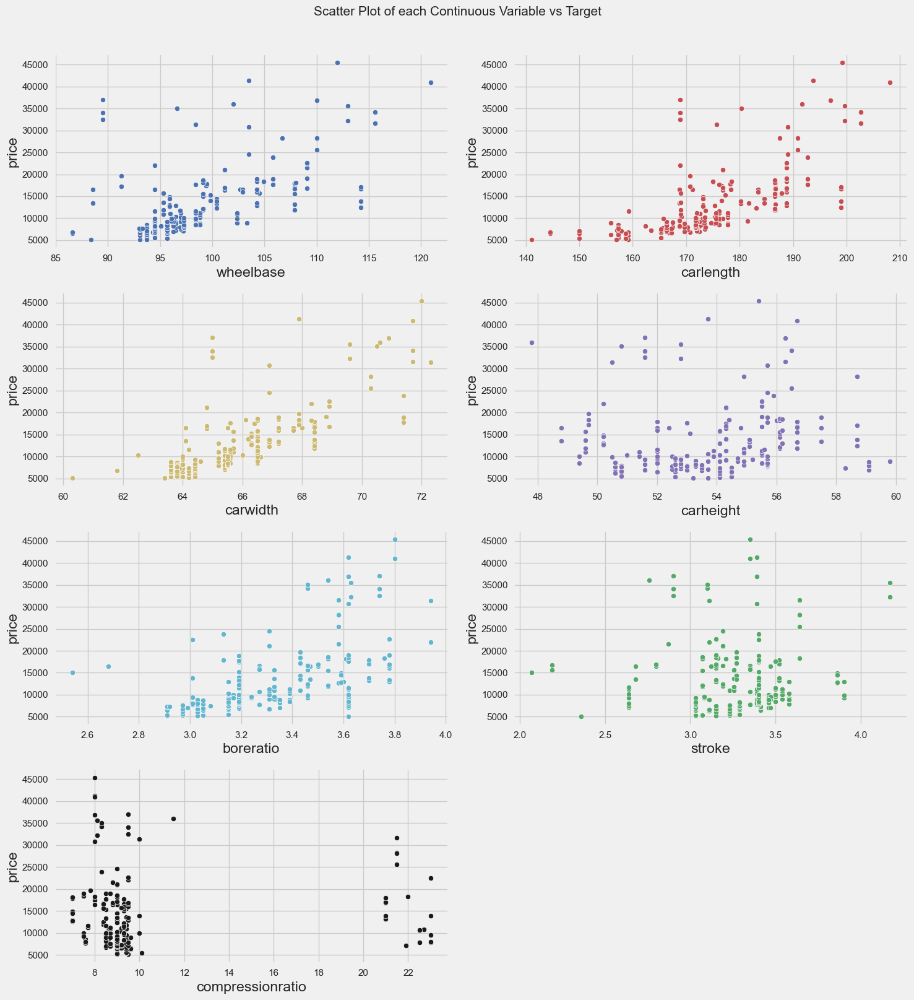

Number of All Scatter Plots = 28


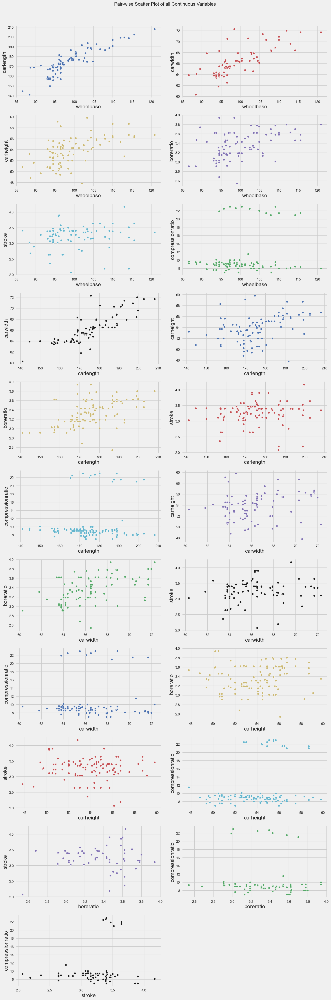

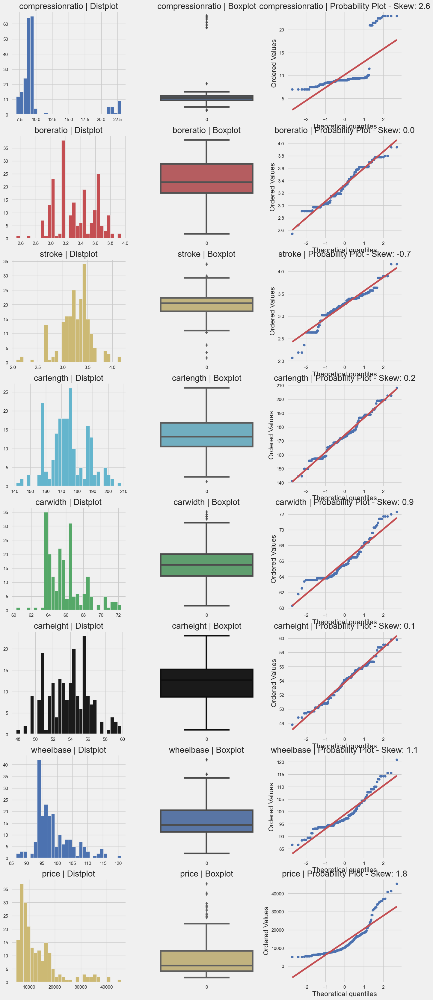

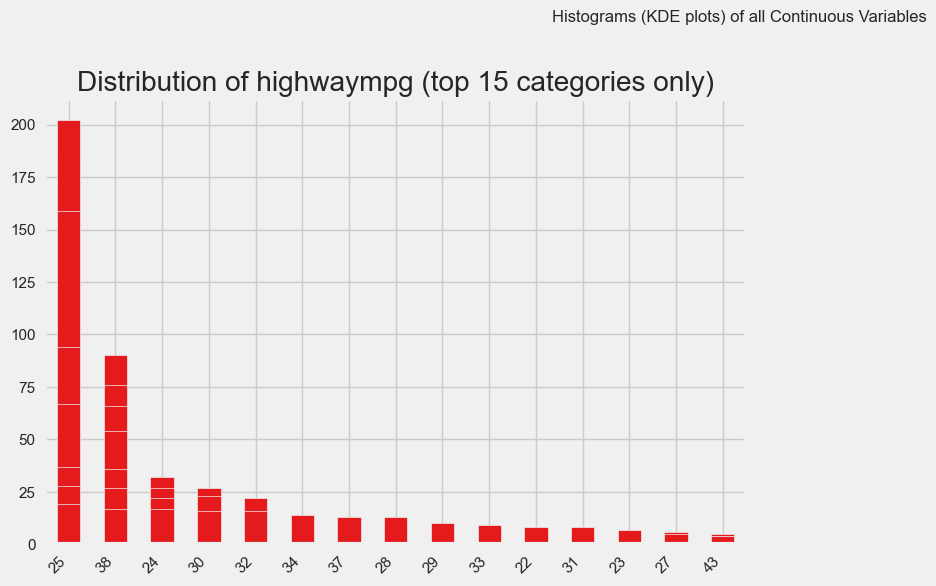

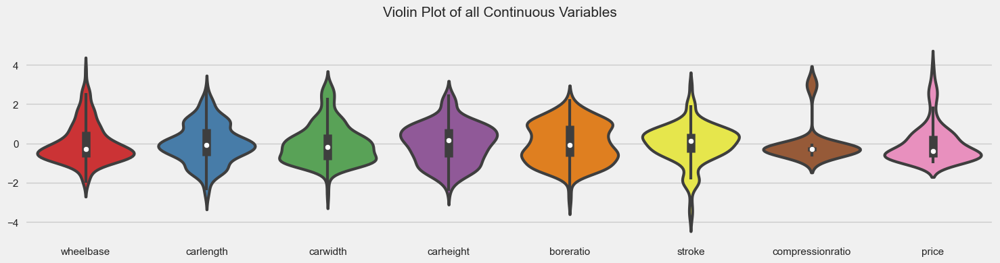

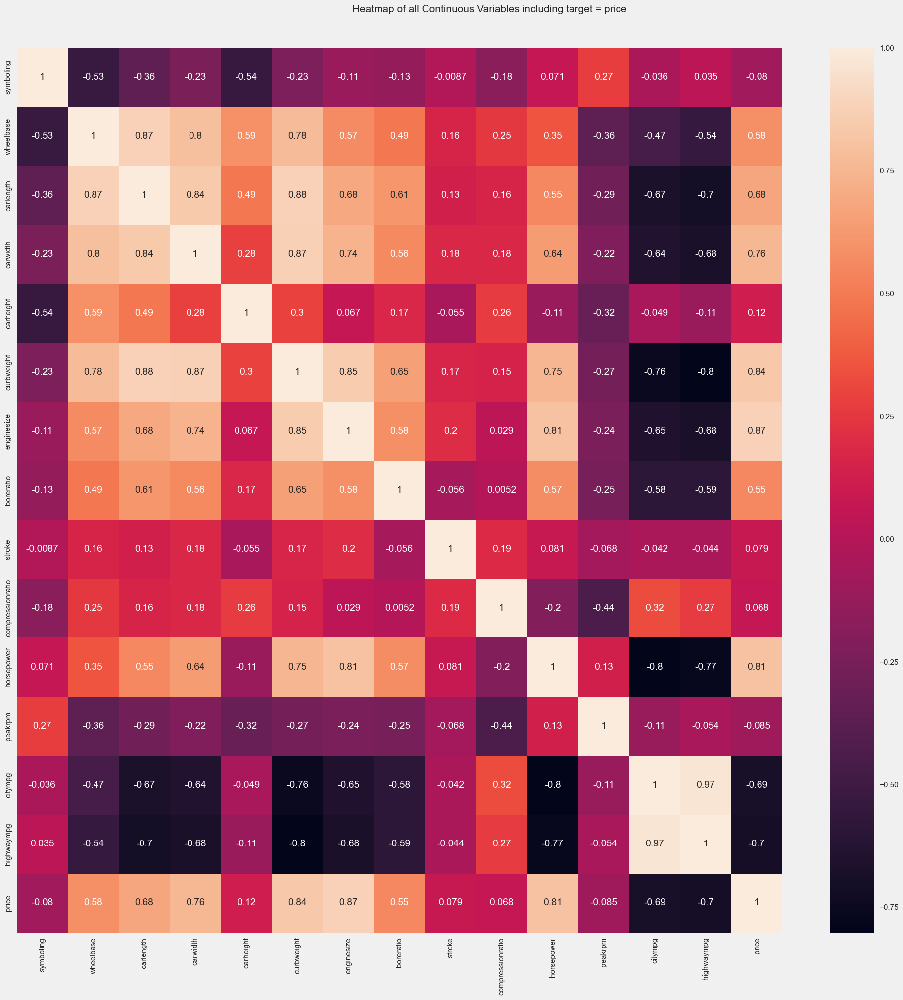

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /Users/irakligrigolia/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /Users/irakligrigolia/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /Users/irakligrigolia/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /Users/irakligrigolia/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /Users/irakligrigolia/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /Users/irakligrigolia/nltk_data...
[nl

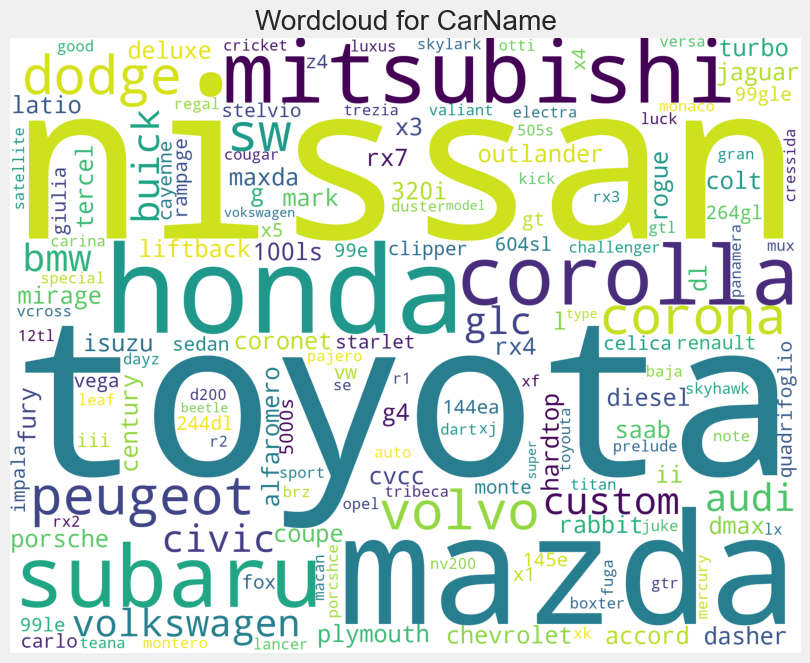

All Plots done
Time to run AutoViz = 36 seconds 

 ###################### AUTO VISUALIZATION Completed ########################
Shape of your Data Set loaded: (205, 26)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  7
    Number of Integer-Categorical Columns =  7
    Number of String-Categorical Columns =  5
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  4
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    25 Predictors classified...
        1 variables removed since they were ID or low-

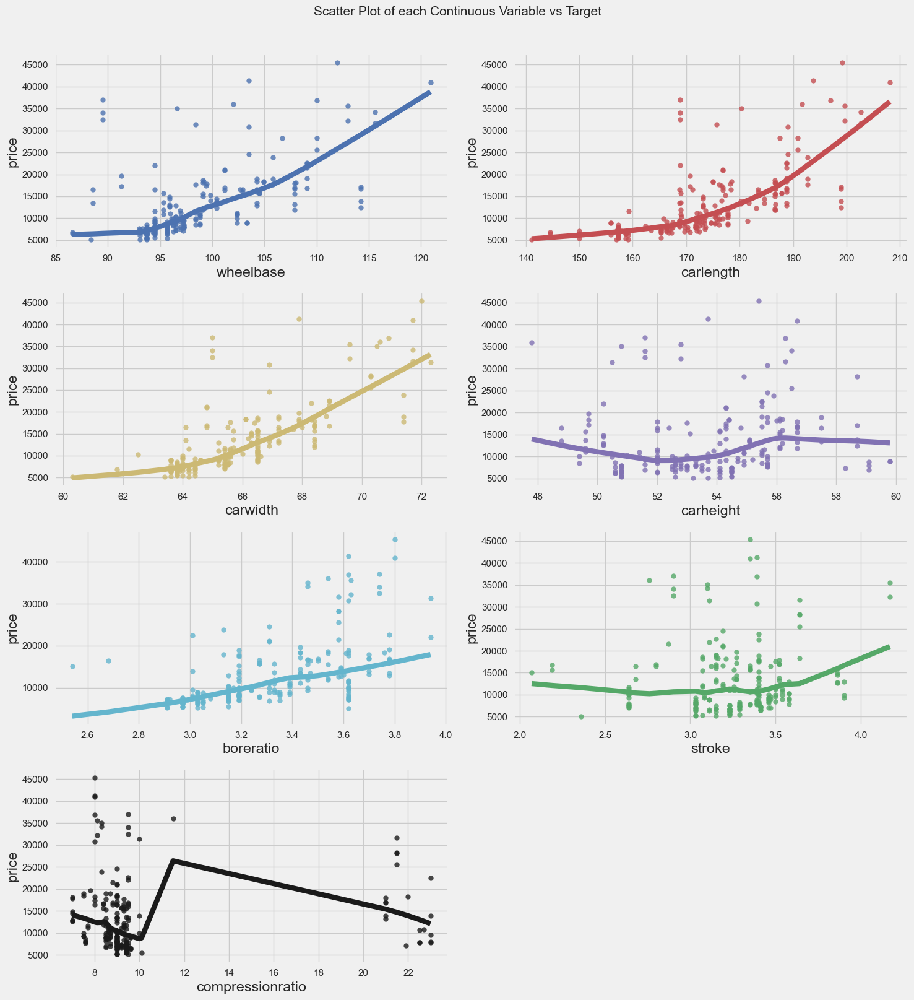

Using Lowess Smoothing. This might take a few minutes for large data sets...
Number of All Scatter Plots = 28


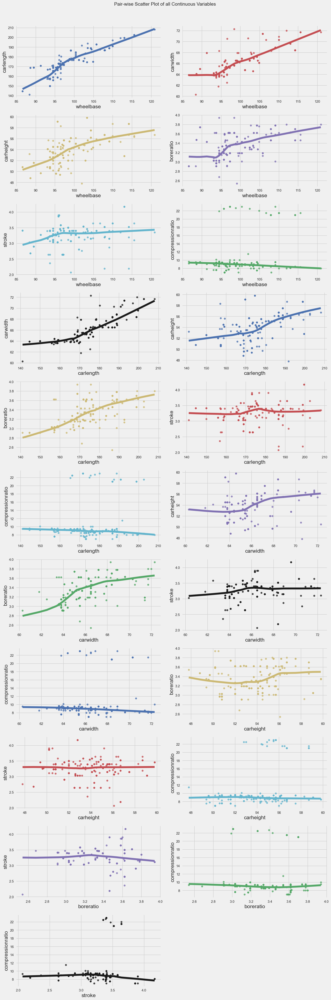

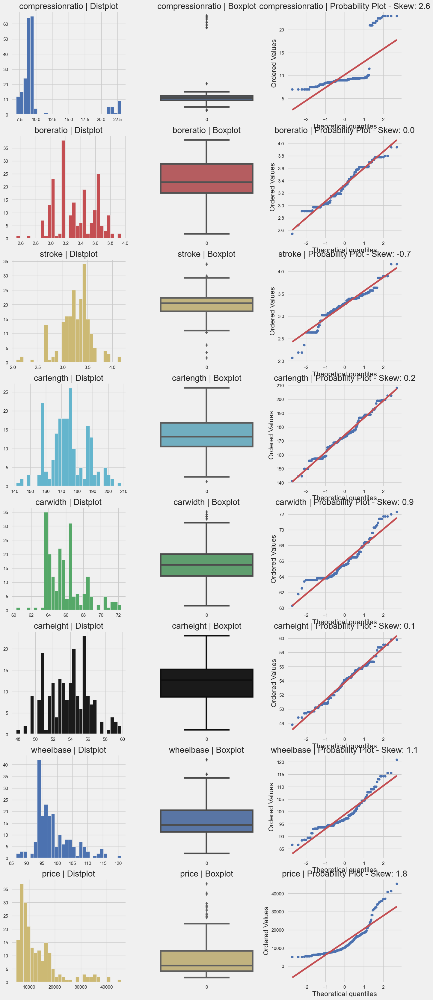

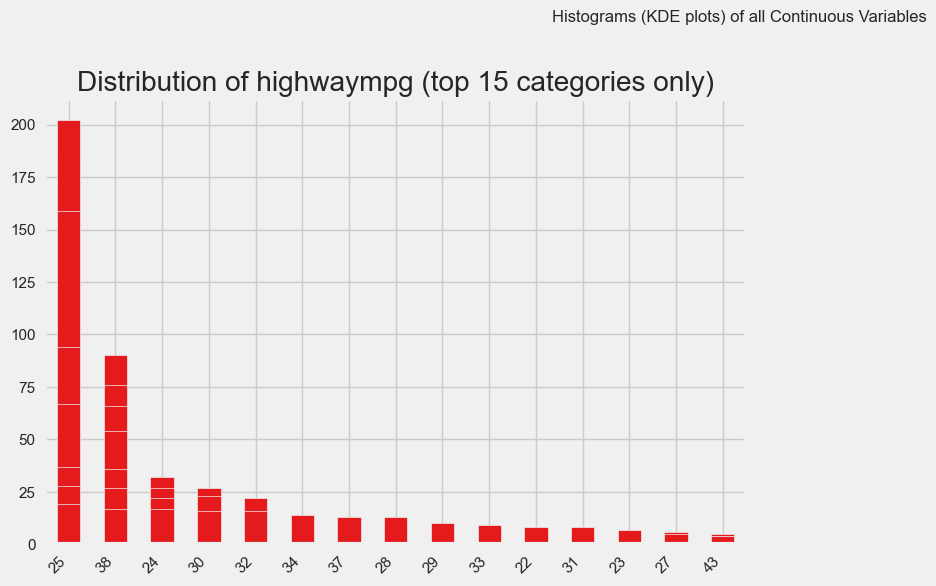

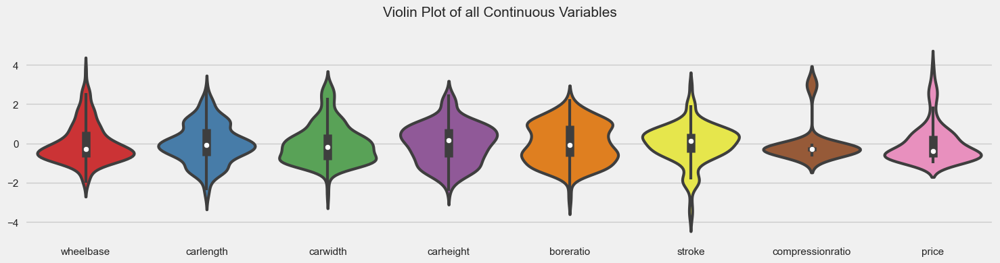

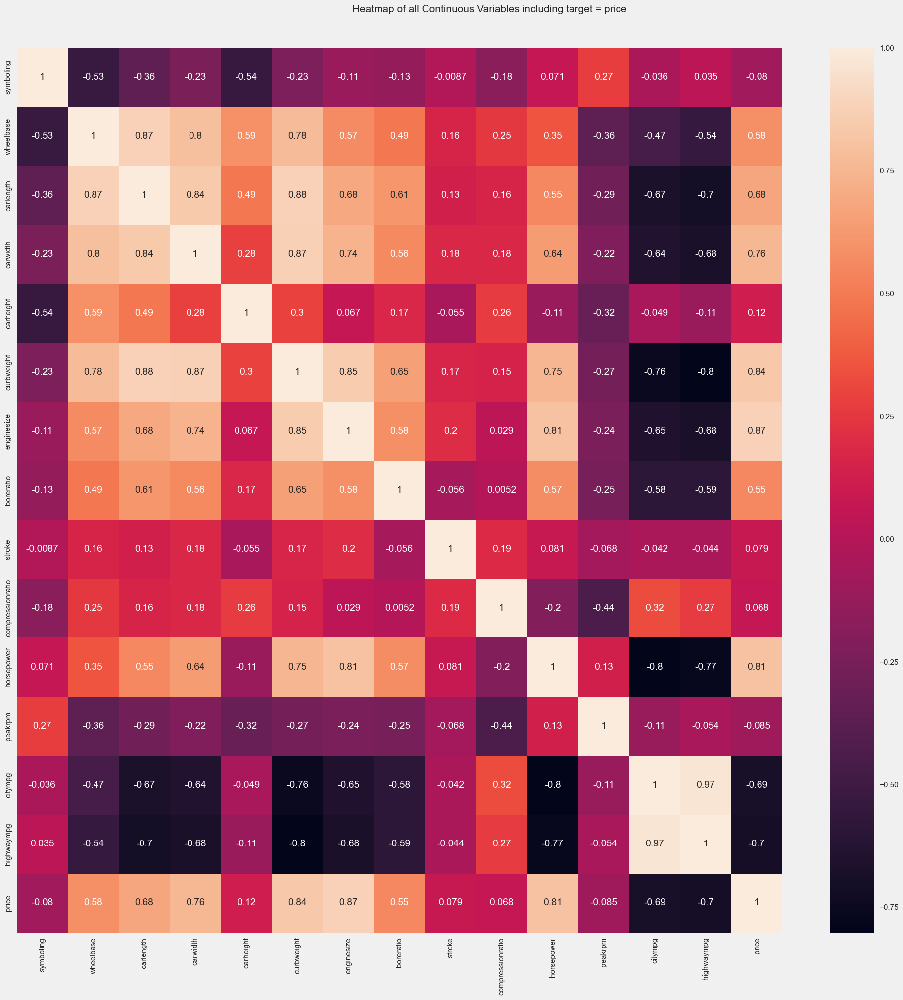

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /Users/irakligrigolia/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /Users/irakligrigolia/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /Users/irakligrigolia/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /Users/irakligrigolia/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /Users/irakligrigolia/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /Users/irakligrigolia/nltk_data...
[nl

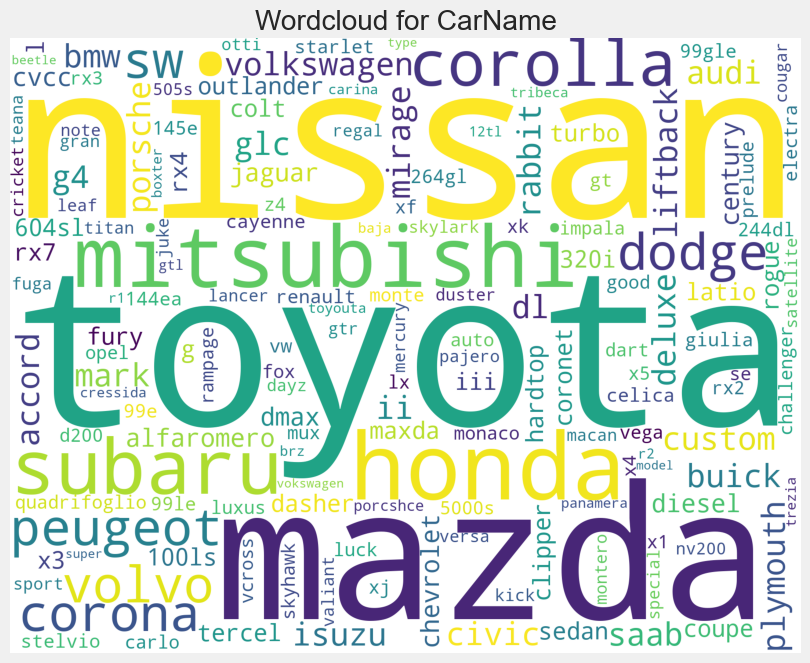

All Plots done
Time to run AutoViz = 37 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,168.8,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,168.8,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,171.2,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,176.6,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,176.6,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,-1,volvo 145e (sw),gas,std,four,sedan,rwd,front,109.1,188.8,...,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845.0
201,-1,volvo 144ea,gas,turbo,four,sedan,rwd,front,109.1,188.8,...,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045.0
202,-1,volvo 244dl,gas,std,four,sedan,rwd,front,109.1,188.8,...,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485.0
203,-1,volvo 246,diesel,turbo,four,sedan,rwd,front,109.1,188.8,...,145,idi,3.01,3.40,23.0,106,4800,26,27,22470.0


In [47]:
av = AV()
dft = av.AutoViz(
    filename="",
    sep=",",
    depVar= "price",
    dfte=df,
    header=0,
    verbose=0,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
)

av.AutoViz(filename = "",sep=',', dfte = df, depVar = 'price', verbose = 0, lowess = 1)

Get rid of outliers

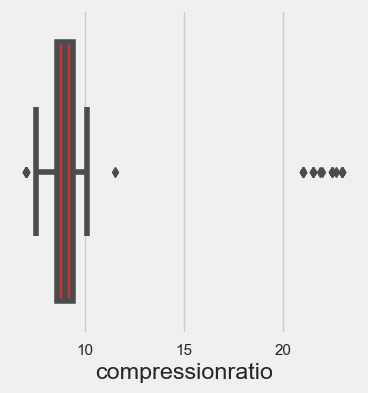

In [48]:
import seaborn as sns
pd.set_option('display.float_format', lambda x: '%.f' % x)
sns.boxplot(x=df["compressionratio"])
plt.gcf().set_size_inches((4, 4))    

plt.show()

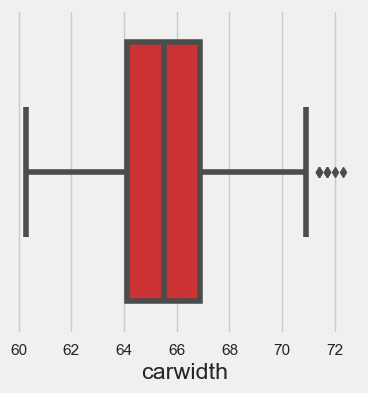

In [49]:
pd.set_option('display.float_format', lambda x: '%.f' % x)
sns.boxplot(x=df["carwidth"])
plt.gcf().set_size_inches((4, 4))    

plt.show()

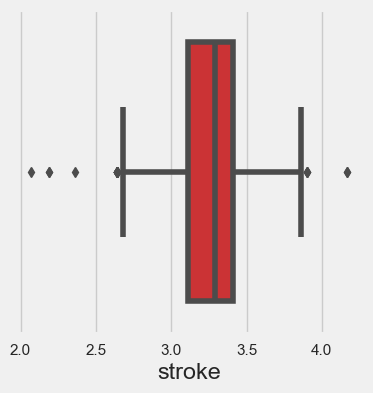

In [50]:
pd.set_option('display.float_format', lambda x: '%.f' % x)
sns.boxplot(x=df["stroke"])
plt.gcf().set_size_inches((4, 4))    

plt.show()

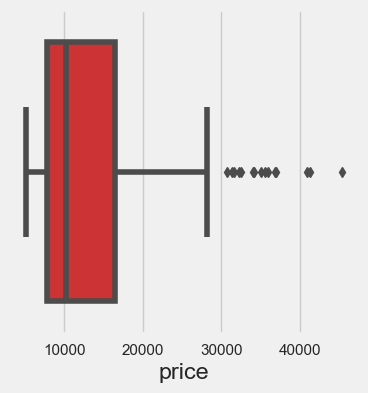

In [51]:
pd.set_option('display.float_format', lambda x: '%.f' % x)
sns.boxplot(x=df["price"])
plt.gcf().set_size_inches((4, 4))    

plt.show()

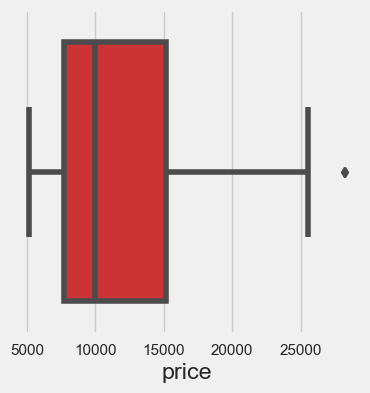

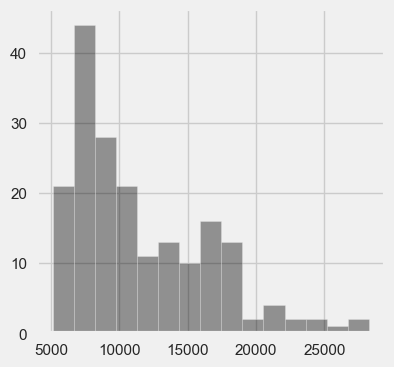

In [52]:
# Get interquintile range to remove outliers
Q1 = df["price"].quantile(0.25)
Q3 = df["price"].quantile(0.75)
IQR = Q3 - Q1

lower_lim = Q1 - 1.5 * IQR
upper_lim = Q3 + 1.5 * IQR 

outliers_low = (df["price"] < lower_lim )
outliers_high =(df["price"] > upper_lim )
#We will lose 175 values if we remove outliers 

df["price"][outliers_low | outliers_high]
df = df[~(outliers_low | outliers_high)]
sns.boxplot(x=df["price"])
plt.gcf().set_size_inches((4, 4))    
plt.show()

sns.distplot(x=df["price"],bins=15, kde=False,color="black")
plt.gcf().set_size_inches((4, 4))    
plt.show()

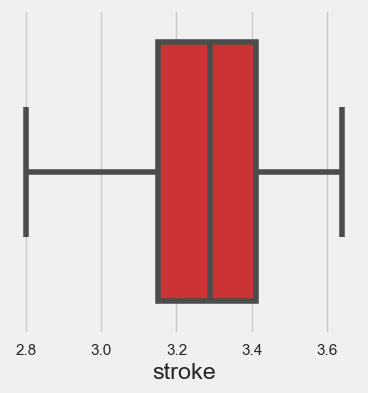

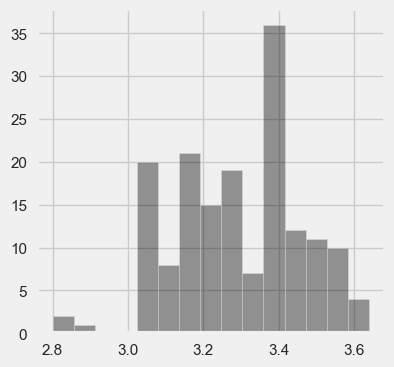

In [53]:
# Get interquintile range to remove outliers
Q1 = df["stroke"].quantile(0.25)
Q3 = df["stroke"].quantile(0.75)
IQR = Q3 - Q1

lower_lim = Q1 - 1.5 * IQR
upper_lim = Q3 + 1.5 * IQR 

outliers_low = (df["stroke"] < lower_lim )
outliers_high =(df["stroke"] > upper_lim )
#We will lose 175 values if we remove outliers 

df["stroke"][outliers_low | outliers_high]
df = df[~(outliers_low | outliers_high)]
sns.boxplot(x=df["stroke"])
plt.gcf().set_size_inches((4, 4))    
plt.show()

sns.distplot(x=df["stroke"],bins=15, kde=False,color="black")
plt.gcf().set_size_inches((4, 4))    
plt.show()

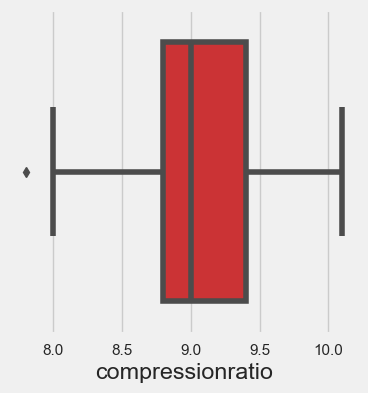

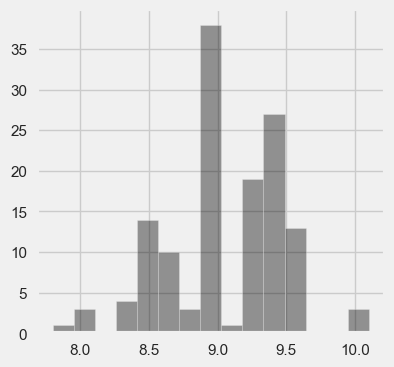

In [54]:
# Get interquintile range to remove outliers
Q1 = df["compressionratio"].quantile(0.25)
Q3 = df["compressionratio"].quantile(0.75)
IQR = Q3 - Q1

lower_lim = Q1 - 1.5 * IQR
upper_lim = Q3 + 1.5 * IQR 

outliers_low = (df["compressionratio"] < lower_lim )
outliers_high =(df["compressionratio"] > upper_lim )
#We will lose 175 values if we remove outliers 

df["compressionratio"][outliers_low | outliers_high]
df = df[~(outliers_low | outliers_high)]
sns.boxplot(x=df["compressionratio"])
plt.gcf().set_size_inches((4, 4))    
plt.show()

sns.distplot(x=df["compressionratio"],bins=15, kde=False,color="black")
plt.gcf().set_size_inches((4, 4))    
plt.show()

Which is most Aspiration repeats in the Dataset

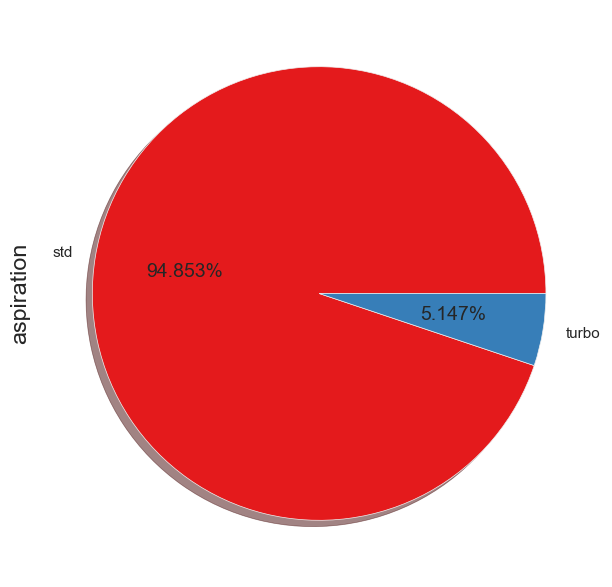

In [59]:
plt.figure(figsize = [7, 7], clear = True, facecolor = "#ffffff")
df["aspiration"].value_counts().plot.pie( autopct='%1.3f%%', shadow = True);

In [64]:
asp_mean = df.groupby("aspiration")['price'].mean()
asp_mean

aspiration
std     10561
turbo   19788
Name: price, dtype: float64

<AxesSubplot: xlabel='aspiration'>

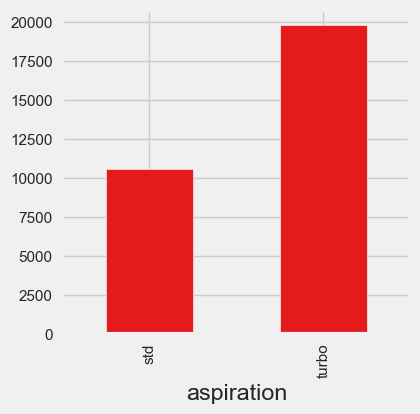

In [66]:
asp_mean.plot.bar(figsize=(4,4))

<AxesSubplot: ylabel='doornumber'>

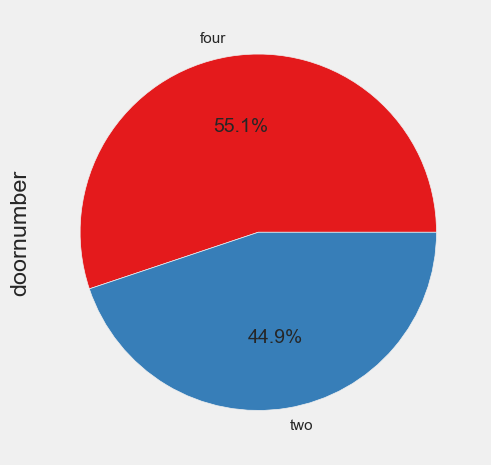

In [69]:
#check door number distribution

df['doornumber'].value_counts().plot.pie(autopct='%1.1f%%', )

In [70]:
#check price depending on door number
dc_mean = df.groupby('doornumber')['price'].mean()
dc_mean


doornumber
four   11600
two    10342
Name: price, dtype: float64

<AxesSubplot: xlabel='doornumber'>

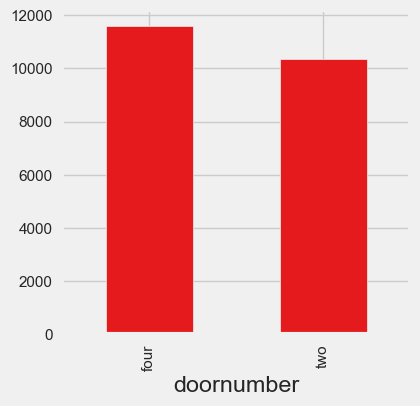

In [72]:
dc_mean.plot.bar(figsize=(4,4))

<AxesSubplot: xlabel='carbody', ylabel='count'>

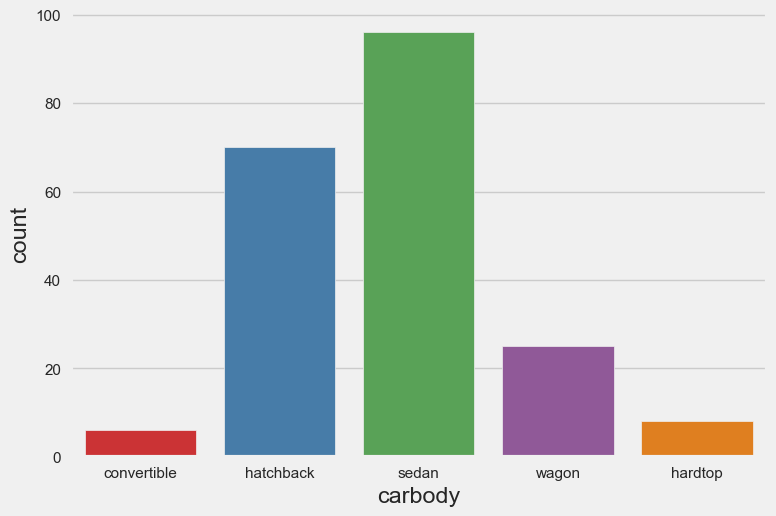

In [78]:
sns.countplot(df,x='carbody') # sedan is the most popular

In [79]:
#check duplicate values
df_dup=df.duplicated().any()
df_dup



False

<AxesSubplot: ylabel='Frequency'>

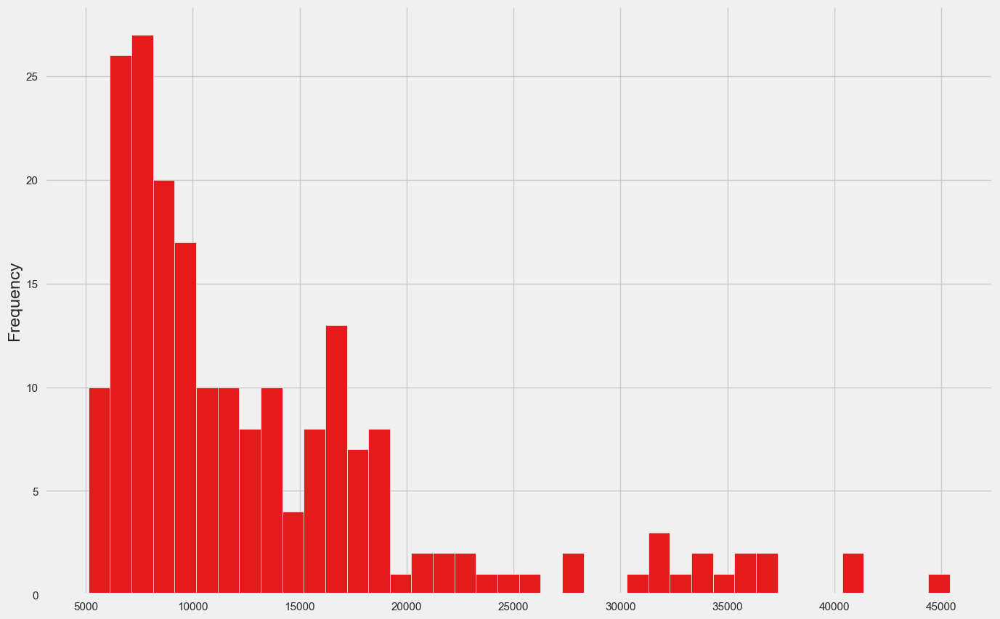

In [83]:
df['price'].plot.hist(figsize=(15,10),bins=40)

In [85]:
df.price.skew() #it is right skewed

1.7776781560914454

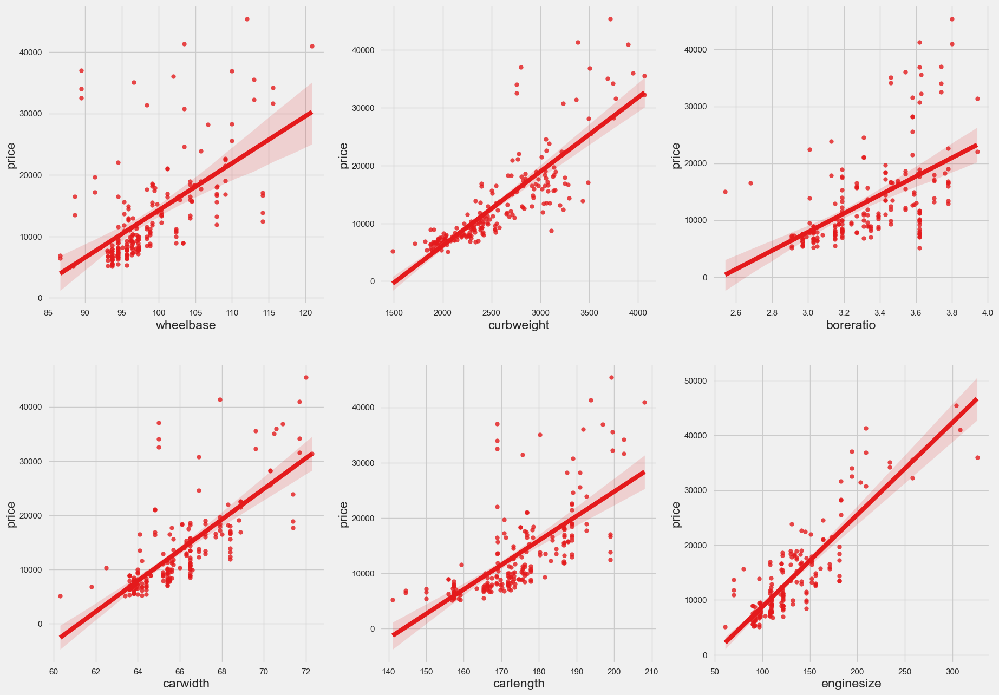

In [86]:
columns=['wheelbase','curbweight','boreratio','carwidth','carlength','enginesize']
plt.figure(figsize=(20, 15))
i=0
for col in columns:
    i=i+1
    plt.subplot(2,3,i)
    sns.regplot(x = col, y = 'price', data = df)
plt.show()

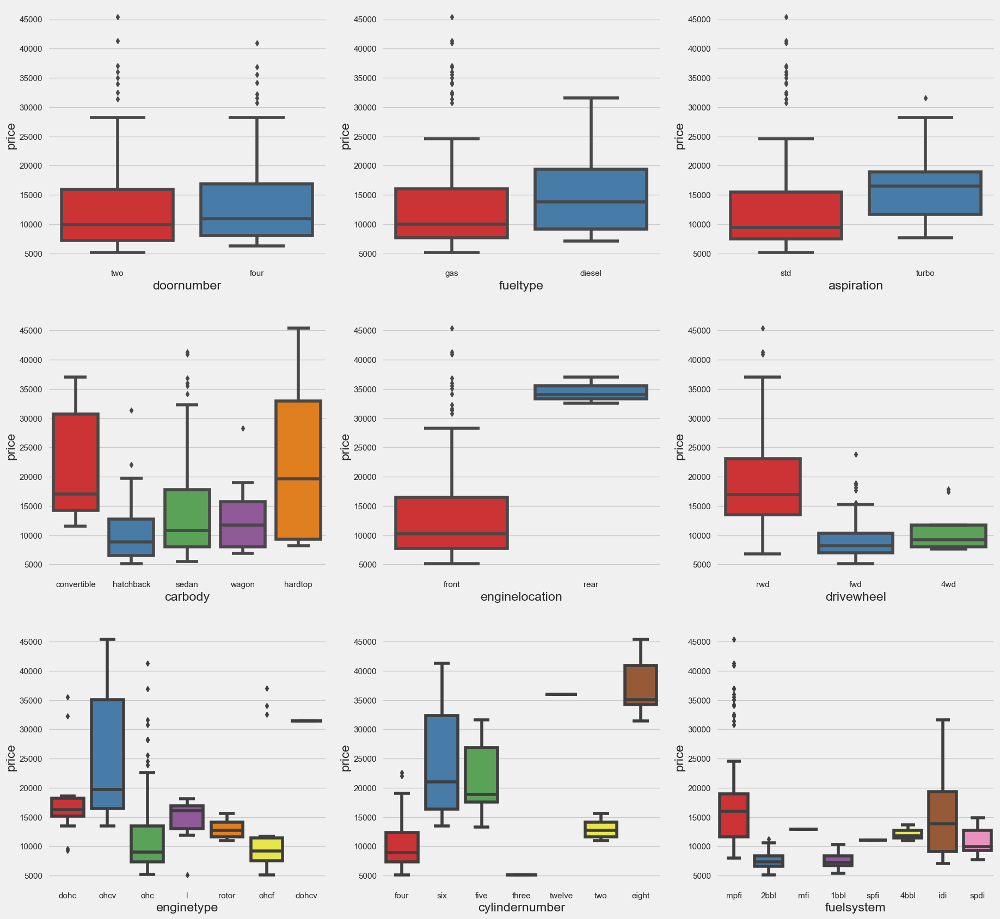

In [87]:
plt.figure(figsize=(20, 20))
columns=['doornumber','fueltype','aspiration','carbody','enginelocation','drivewheel','enginetype','cylindernumber','fuelsystem']
i=0
for col in columns:
    i=i+1
    plt.subplot(3,3,i)
    sns.boxplot(x = col, y = 'price', data = df)
plt.show()

Insights:

Door numbers doesn't affect on price.

Cars with disel are more expensive.

The cars with rear enginelocation are way more expensive than cars with front enginelocation.

Cars with eight cylinder cost significantly more.


### Converting categorical values to numerical

In [88]:
le=LabelEncoder()

df['fueltype']= le.fit_transform(df.fueltype)
df['enginelocation']=le.fit_transform(df.enginelocation)
df['cylindernumber']=le.fit_transform(df.cylindernumber)
df['enginetype']=le.fit_transform(df.enginetype)
df['carbody']= le.fit_transform(df.carbody)
df['aspiration']=le.fit_transform(df.aspiration)

# Model building

## Linear Regression

In [90]:
# Splitting the dataset into the Training set and Test set
X=df.drop(["car_ID","CarName","doornumber","drivewheel","enginelocation","fuelsystem","symboling",
           'compressionratio','peakrpm','citympg','highwaympg','carheight','stroke'],axis=1)
y=df['price']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2,shuffle=True,random_state = 3)

In [91]:
#scaling
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)

In [92]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)



LinearRegression()

In [94]:
y_pred = lin_reg.predict(X_test)
pd.DataFrame({'test':y_test,'pred':y_pred}).head()

,test,pred
189,11595,10802
183,7975,7758
118,5572,5737
165,9298,8870
160,7738,7558


### Evaluation

In [105]:
print(f" MAE:  {mean_absolute_error(y_test, y_pred)}")
print(f" RMSE: {mean_squared_error(y_test, y_pred)}")
print(f" MAPE: {round(mean_absolute_percentage_error(y_test, y_pred) * 100)}%")



 MAE:  1229.8195576860342
 RMSE: 3562726.2859834973
 MAPE: 6%


In [97]:
lin_reg.score(X_test,y_test)

0.956876379072566

For linear regression model the score is 0.95 approximately and our MAPE score is ~6% which is really good.